In [1]:
import os 
from PIL import Image
import numpy as np
import filetype
import matplotlib.pyplot as plt
import scipy.io
import cv2

# 1. Camera  Parameters

## 1.1 Import Data from tone_curves

In [2]:
curve_path = '../tone_mapping_data'
curve_name = os.path.join(curve_path, 'tone_curves.mat')
curve_inv_name = os.path.join(curve_path, 'tone_curves_inv.mat')
tone_curves = scipy.io.loadmat(curve_name)
tone_curves_inv = scipy.io.loadmat(curve_inv_name)

In [3]:
I = tone_curves['I'] # Irradiance
B = tone_curves['B'] # Brightness
I_inv = tone_curves_inv['invI']
B_inv = tone_curves_inv['invB']

Text(0.5, 1.0, 'Brightness')

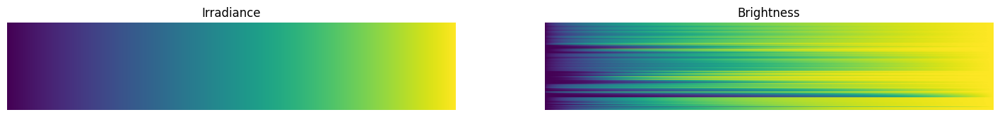

In [4]:
plt.figure(figsize=(18, 6))
plt.subplot(1, 2, 1)
plt.axis('off')
plt.imshow(I)
plt.title('Irradiance')
plt.subplot(1, 2, 2)
plt.axis('off')
plt.imshow(B)
plt.title('Brightness')

Text(0.5, 1.0, 'inv_Brightness')

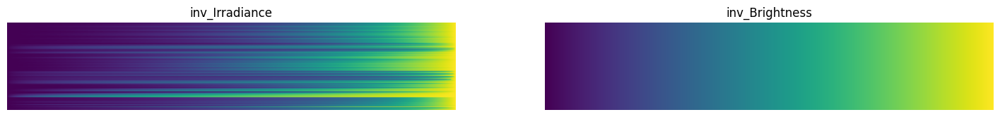

In [5]:
plt.figure(figsize=(18, 6))
plt.subplot(1, 2, 1)
plt.axis('off')
plt.imshow(I_inv)
plt.title('inv_Irradiance')
plt.subplot(1, 2, 2)
plt.axis('off')
plt.imshow(B_inv)
plt.title('inv_Brightness')

In [6]:
# Tone Curves Parameters
tone_index = 170
B[tone_index]

array([0.000000e+00, 5.767133e-05, 1.163159e-04, ..., 9.956537e-01,
       9.978255e-01, 1.000000e+00], shape=(1024,), dtype=float32)

## 1.2 Color Correction Matrix

In [7]:
ccm = np.array([1.0234, -0.2969, -0.2266, 
                -0.5625, 1.6328, -0.0469, 
                -0.0703, 0.2188, 0.6406])
ccm = np.reshape(ccm, (3, 3))
ccm = (ccm / np.tile(np.sum(ccm, axis=1), [3, 1]).T).T
ccm_inv = np.linalg.inv(np.copy(ccm))

## 1.3 White Balance

In [8]:
# White Balance Parameters
fr = 0.7715567349551743
fb = 0.9068480239589546

# 2.  Load Image

In [9]:
def load_image(img_path):
    if not os.path.exists(img_path):
        print("Error the file not exists.")
    if not filetype.is_image(img_path):
        print("Error the file is not image.")

    img = Image.open(img_path).convert("RGB")
    img = np.array(img, dtype=np.uint8)               # [0-255] uint8
    img = img = img.astype('double') / 255.0          # [0-1] 標準化 
    return img

(402, 306, 3)
[[[0.34901961 0.28627451 0.25098039]
  [0.34901961 0.28627451 0.25490196]
  [0.35294118 0.29019608 0.25490196]
  ...
  [0.62745098 0.58431373 0.58431373]
  [0.62745098 0.58431373 0.58431373]
  [0.89019608 0.87843137 0.87843137]]

 [[0.3372549  0.2745098  0.24705882]
  [0.34117647 0.27843137 0.25098039]
  [0.34509804 0.28235294 0.25490196]
  ...
  [0.63529412 0.59215686 0.59215686]
  [0.63529412 0.59215686 0.59215686]
  [0.89019608 0.87843137 0.87843137]]

 [[0.32941176 0.26666667 0.24313725]
  [0.33333333 0.27058824 0.24705882]
  [0.3372549  0.2745098  0.25098039]
  ...
  [0.64313725 0.60392157 0.60392157]
  [0.64313725 0.6        0.6       ]
  [0.89411765 0.88235294 0.88235294]]

 ...

 [[0.81176471 0.78823529 0.76078431]
  [0.81568627 0.79215686 0.76470588]
  [0.81960784 0.79607843 0.76862745]
  ...
  [0.74509804 0.6627451  0.58823529]
  [0.74509804 0.65882353 0.58823529]
  [0.9254902  0.89803922 0.87843137]]

 [[0.82352941 0.79607843 0.76470588]
  [0.82745098 0.8      

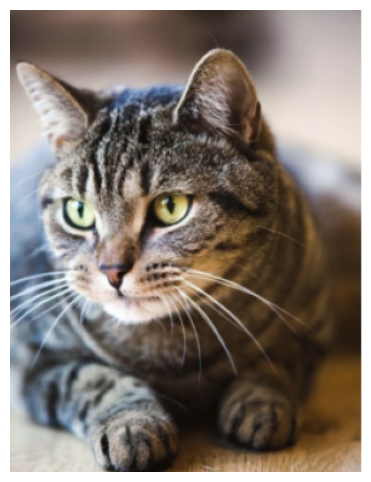

In [10]:
img_path = "../input_image/cat3.png"
img = load_image(img_path)
print(img.shape)
print(img)

plt.figure(figsize=(12, 6))
plt.axis('off')
plt.imshow(img)

In [11]:

def PrintMinMax(img):
    # 查找最大值
    max_value = np.max(img)

    # 查找最小值
    min_value = np.min(img)

    print("最大值:", max_value)
    print("最小值:", min_value)


# 3. Inverse ISP Process

## 3.1 inverse tone mapping

In [12]:
def tone_mapping(img, I, B, index=0, inv=False):
    '''
    input: 
        img: H*W*3 nmupy array, input image
        I: 201*1024 array, represents 201 tone curses for Irradiance
        B: 201*1024 array, represents 201 tone curses for Brightness
        index: int, choose which curve to use, default is 0
        inv: bool, judge whether tone mapping(Fasle) or inverse mapping(True), default is False
    output:
        output: H*W*3 numpy array, output image after (inverse) tone mapping
    '''
    ###########################################################################
    # TODO:                                                                   #
    # following above instruction to get tone mapping as output               #
    # and inverse tone mapping result as output.                              #
    ###########################################################################     


    # 取得影像的高 H、寬 W 和通道數 C (通常為 3，代表 RGB)
    H, W, C = img.shape
    # 創建與輸入影像相同大小的空白陣列來存放結果
    output = np.zeros((H, W, C), dtype=np.float32)

    # 取得指定 index 的 Tone Mapping 曲線
    irradiance_curve = I[index]  # 這條曲線代表光照強度 (I)
    brightness_curve = B[index]  # 這條曲線代表對應的亮度 (B)
    
    # 逐一處理 R、G、B 三個通道
    for channel in range(C):
        # 取得當前通道的影像數據 (H*W 大小的 2D 陣列)
        channel_data = img[:, :, channel]
        
        # 如果 inv=True，則執行反向 Tone Mapping (Brightness → Irradiance)
        if inv:
            mapped_data = np.interp(channel_data, brightness_curve, irradiance_curve)
        else:
            # 如果 inv=False，則執行正向 Tone Mapping (Irradiance → Brightness)
            mapped_data = np.interp(channel_data, irradiance_curve, brightness_curve)

        # 將處理後的數據存回 output 陣列的對應通道
        output[:, :, channel] = mapped_data
        output = np.clip(output, 0, 1)

    return output



In [13]:
img_inverse_tone = tone_mapping(img, I_inv, B_inv, index=tone_index, inv=True)


Text(0.5, 1.0, 'Image after inverse tone')

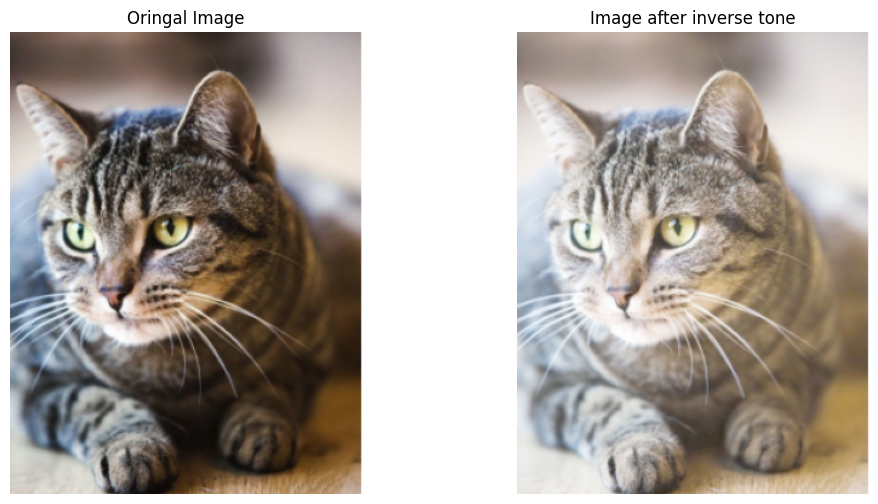

In [14]:
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.axis('off')
plt.imshow(img)
plt.title('Oringal Image')
plt.subplot(1, 2, 2)
plt.axis('off')
plt.imshow(img_inverse_tone)
plt.title('Image after inverse tone')

## 3.2 from RGB to CIE XYZ

In [15]:
import cv2
img_inverse_tone_XYZ = cv2.cvtColor(img_inverse_tone.astype(np.float32), cv2.COLOR_RGB2XYZ)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.1411094..1.0884062].


Text(0.5, 1.0, 'Image after CIE')

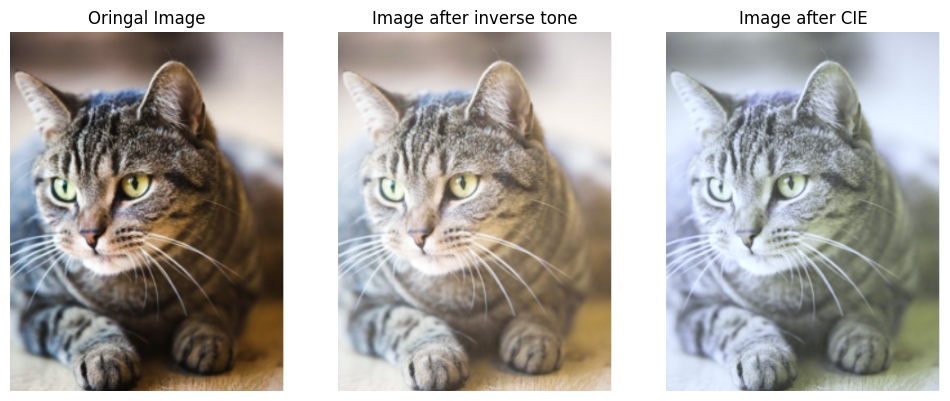

In [16]:
plt.figure(figsize=(12, 6))
plt.subplot(1, 3, 1)
plt.axis('off')
plt.imshow(img)
plt.title('Oringal Image')
plt.subplot(1, 3, 2)
plt.axis('off')
plt.imshow(img_inverse_tone)
plt.title('Image after inverse tone')
plt.subplot(1, 3, 3)
plt.axis('off')
plt.imshow(img_inverse_tone_XYZ)
plt.title('Image after CIE')

## 3.3 color correction

In [17]:
def color_correction(img, ccm):
    '''
    input: 
        img: H*W*3 nmupy array, input image
        cmm: 3*3 nmupy array, color correction matrix
    output:
        output: H*W*3 numpy array, output image after color correction
    '''
    ###########################################################################
    # TODO:                                                                   #
    # following above instruction to get color correction result              #
    # 將每個像素 (R, G, B) 轉換成 (X, Y, Z)                                    #
    ########################################################################### 
    output = np.dot(img, ccm)
    
    #### Prevent the value larger than 1 or less than 0
    output = np.clip(output, 0, 1)
    return output

In [18]:
ccm

array([[ 2.04720944, -0.54963846, -0.08908884],
       [-0.59391878,  1.59546609,  0.27727791],
       [-0.45329066, -0.04582763,  0.81181092]])

In [19]:
img_inverse_ccm = color_correction(img_inverse_tone_XYZ, ccm)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.1411094..1.0884062].


Text(0.5, 1.0, 'Image after CCM')

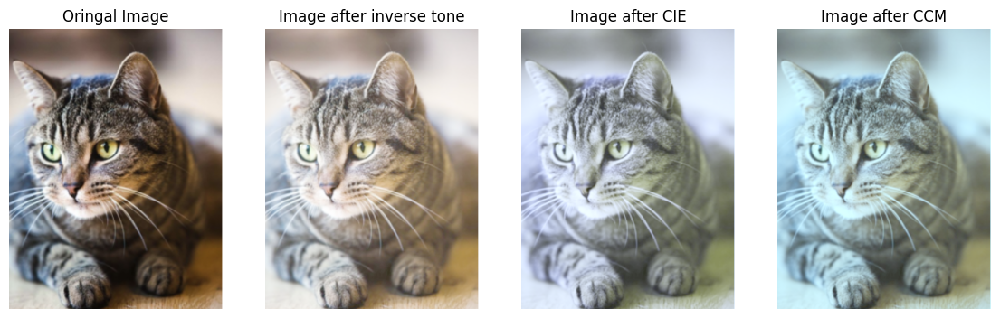

In [20]:
plt.figure(figsize=(14, 6))
plt.subplot(1, 4, 1)
plt.axis('off')
plt.imshow(img)
plt.title('Oringal Image')
plt.subplot(1, 4, 2)
plt.axis('off')
plt.imshow(img_inverse_tone)
plt.title('Image after inverse tone')
plt.subplot(1, 4, 3)
plt.axis('off')
plt.imshow(img_inverse_tone_XYZ)
plt.title('Image after CIE')
plt.subplot(1, 4, 4)
plt.axis('off')
plt.imshow(img_inverse_ccm)
plt.title('Image after CCM')

## 3.4 Mosaic

In [21]:
import colour
from colour.plotting import *
from colour_demosaicing import  demosaicing_CFA_Bayer_Malvar2004



In [22]:

def mosaic(img, pattern):
    '''
    Input:
        img: H*W*3 numpy array, input image.
        pattern: string, 4 different Bayer patterns (RGGB, GRBG, GBRG, BGGR)
    Output:
        output: H*W numpy array, output image after mosaic.
    '''
    ########################################################################
    # TODO:                                                                #
    #   1. Create the H*W output numpy array.                              #   
    #   2. Discard other two channels from input 3-channel image according #
    #      to given Bayer pattern.                                         #
    #                                                                      #
    #   e.g. If Bayer pattern now is BGGR, for the upper left pixel from   #
    #        each four-pixel square, we should discard R and G channel     #
    #        and keep B channel of input image.                            #     
    #        (since upper left pixel is B in BGGR bayer pattern)           #
    ########################################################################
    
    # 取得影像的高 H、寬 W 和通道數 C (通常為 3，代表 RGB)
    H, W, C = img.shape
    # 創建與輸入影像相同大小的空白陣列來存放結果
    output = np.zeros((H, W), dtype=np.float32)    

    for i in range(0, H, 2):
        for j in range(0, W, 2):
            # 根據 Bayer pattern 提取顏色通道
            if pattern == 'RGGB':
                output[i, j] = img[i, j, 0]  # R
                output[i, j+1] = img[i, j+1, 1]  # G
                output[i+1, j] = img[i+1, j, 1]  # G
                output[i+1, j+1] = img[i+1, j+1, 2]  # B     
            elif pattern == "GRBG":
                output[i, j] = img[i, j, 1]  # G
                output[i, j+1] = img[i, j+1, 0]  # R
                output[i+1, j] = img[i+1, j, 2]  # B
                output[i+1, j+1] = img[i+1, j+1, 1]  # G            
            elif pattern == "GBRG":
                output[i, j] = img[i, j, 1]  # G
                output[i, j+1] = img[i, j+1, 2]  # B
                output[i+1, j] = img[i+1, j, 0]  # R
                output[i+1, j+1] = img[i+1, j+1, 2]  # G    
            elif pattern == "BGGR":
                output[i, j] = img[i, j, 2]  # B
                output[i, j+1] = img[i, j+1, 1]  # G
                output[i+1, j] = img[i+1, j, 1]  # G
                output[i+1, j+1] = img[i+1, j+1, 0]  # R   
    
    output = np.clip(output, 0, 1)
    return output


def demosaic(img, pattern):
    '''
    Input:
        img: H*W numpy array, input RAW image.
        pattern: string, 4 different Bayer patterns (GRBG, RGGB, GBRG, BGGR)
    Output:
        output: H*W*3 numpy array, output de-mosaic image.
    '''
    #### Using Python colour_demosaicing library
    #### You can write your own version, too
    output = demosaicing_CFA_Bayer_Malvar2004(img,pattern)
    output = np.clip(output, 0, 1)

    return output

In [23]:
def mosaic_graph(mosaic_list, pattern_list, img):
    plt.figure(figsize=(18, 6))
    plt.subplot(1, 5, 1)
    plt.axis('off')
    plt.imshow(img)
    plt.title('Oringal Image')
     
    plt.subplot(1, 5, 2)
    plt.axis('off')
    plt.imshow(mosaic_list[0])
    plt.title(pattern_list[0])
    plt.subplot(1, 5, 3)
    plt.axis('off')
    plt.imshow(mosaic_list[1])
    plt.title(pattern_list[1])
    plt.subplot(1, 5, 4)
    plt.axis('off')
    plt.imshow(mosaic_list[2])
    plt.title(pattern_list[2])
    plt.subplot(1, 5, 5)
    plt.axis('off')
    plt.imshow(mosaic_list[3])
    plt.title(pattern_list[3])
    


### mosaic_graph

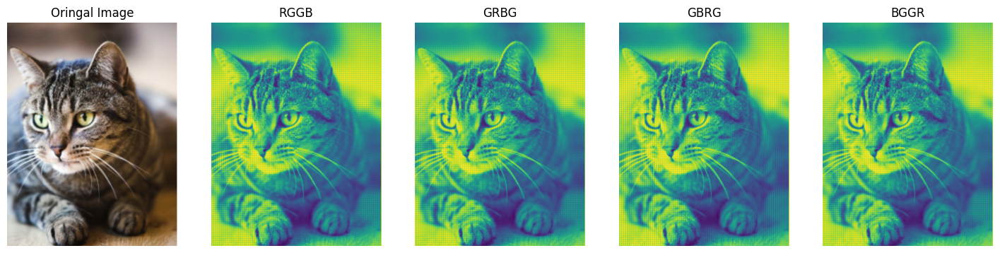

In [24]:
pattern_list = ["RGGB", "GRBG", "GBRG", "BGGR"]
pattern = pattern_list[0]
mosaic_list = []

for i in range(len(pattern_list)):
    img_mosaic_sub = mosaic(img_inverse_ccm, pattern=pattern_list[i])
    mosaic_list.append(img_mosaic_sub)


mosaic_graph(mosaic_list, pattern_list, img)

img_mosaic = mosaic(img_inverse_ccm, pattern=pattern)
img_mosaic_AA = mosaic_list[0]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.141109..1.08841].


Text(0.5, 1.0, 'Image after mosaic')

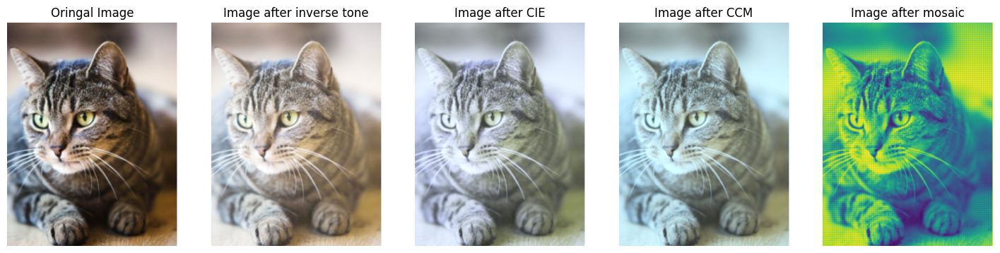

In [25]:
plt.figure(figsize=(18, 6))
plt.subplot(1, 5, 1)
plt.axis('off')
plt.imshow(img)
plt.title('Oringal Image')
plt.subplot(1, 5, 2)
plt.axis('off')
plt.imshow(img_inverse_tone)
plt.title('Image after inverse tone')
plt.subplot(1, 5, 3)
plt.axis('off')
plt.imshow(img_inverse_tone_XYZ)
plt.title('Image after CIE')
plt.subplot(1, 5, 4)
plt.axis('off')
plt.imshow(img_inverse_ccm)
plt.title('Image after CCM')
plt.subplot(1, 5, 5)
plt.axis('off')
plt.imshow(img_mosaic)
plt.title('Image after mosaic')

## 3.5 Inverse AWB
1. Create a numpy array with shape of input RAW image.
2. According to the given Bayer pattern, fill the fr into  correspinding red channel position and fb into correspinding  blue channel position. Fill 1 into green channel position otherwise.  

In [26]:
def inv_AWB_graph(inv_AWB_list, img):   
    plt.figure(figsize=(18, 6))
    plt.subplot(1, 5, 1)
    plt.axis('off')
    plt.imshow(img)
    plt.title('Oringal Image')

    plt.subplot(1, 5, 2)
    plt.axis('off')
    plt.imshow(inv_AWB_list[0])
    plt.title(pattern_list[0])
    plt.subplot(1, 5, 3)
    plt.axis('off')
    plt.imshow(inv_AWB_list[1])
    plt.title(pattern_list[1])
    plt.subplot(1, 5, 4)
    plt.axis('off')
    plt.imshow(inv_AWB_list[2])
    plt.title(pattern_list[2])
    plt.subplot(1, 5, 5)
    plt.axis('off')
    plt.imshow(inv_AWB_list  [3])
    plt.title(pattern_list[3])    
    

In [27]:
def generate_wb_mask(img, pattern, fr, fb):
    '''
    Input:
        img: H*W numpy array, RAW image
        pattern: string, 4 different Bayer patterns (GRBG, RGGB, GBRG, BGGR)
        fr: float, white balance factor of red channel
        fb: float, white balance factor of blue channel 
    Output:
        mask: H*W numpy array, white balance mask
    '''
    ########################################################################
    # TODO:                                                                #
    #   1. Create a numpy array with shape of input RAW image.             #
    #   2. According to the given Bayer pattern, fill the fr into          #
    #      correspinding red channel position and fb into correspinding    #
    #      blue channel position. Fill 1 into green channel position       #
    #      otherwise.                                                      #
    ########################################################################

    # 取得影像的高 H、寬 W 和通道數 C (通常為 3，代表 RGB)
    H, W = img.shape
    
    # 創建與輸入影像相同大小的空白陣列來存放結果
    # 預設填充 1，表示綠色通道
    mask = np.ones((H, W), dtype=np.float32)    
  

    for i in range(0, H, 2):
        for j in range(0, W, 2):
            # 根據 Bayer pattern 修改紅色、藍色通道數值
            if pattern == 'RGGB':
                mask[i,j] = fr
                mask[i+1,j+1] = fb 
            elif pattern == "GRBG":
                mask[i+1,j] = fr
                mask[i,j+1] = fb                        
            elif pattern == "GBRG":
                mask[i,j+1] = fr
                mask[i+1,j] = fb 
            elif pattern == "BGGR":
                mask[i+1,j+1] = fr
                mask[i,j] = fb 
        
    return mask

### inv_AWB_graph

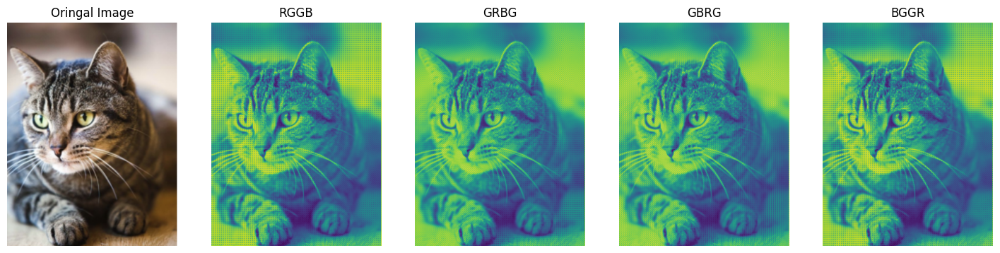

In [28]:
fr = 0.7715567349551743
fb = 0.9068480239589546
wb_mask = generate_wb_mask(img_mosaic, pattern, fr, fb)
img_Inverse_WB = img_mosaic  * wb_mask

inv_AWB_list = []
for i in range(len(pattern_list)):
    wb_mask = generate_wb_mask(mosaic_list[i], pattern_list[i], fr, fb)
    img_Inverse_WB_sub = mosaic_list[i] * wb_mask
    inv_AWB_list.append(img_Inverse_WB_sub)
    

inv_AWB_graph(inv_AWB_list, img)
img_Inverse_WBEEE = inv_AWB_list[0]



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.141109..1.08841].


Text(0.5, 1.0, 'Image after Inverse WB')

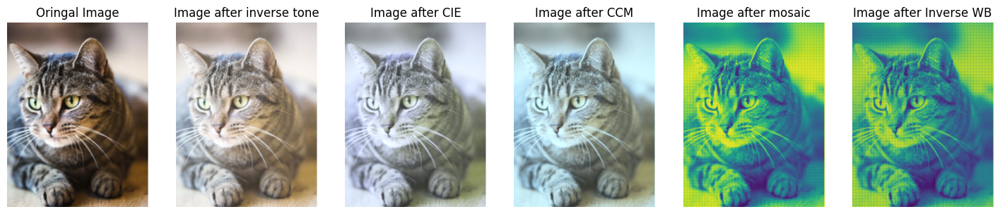

In [29]:
plt.figure(figsize=(18, 6))
plt.subplot(1, 6, 1)
plt.axis('off')
plt.imshow(img)
plt.title('Oringal Image')
plt.subplot(1, 6, 2)
plt.axis('off')
plt.imshow(img_inverse_tone)
plt.title('Image after inverse tone')
plt.subplot(1, 6, 3)
plt.axis('off')
plt.imshow(img_inverse_tone_XYZ)
plt.title('Image after CIE')
plt.subplot(1, 6, 4)
plt.axis('off')
plt.imshow(img_inverse_ccm)
plt.title('Image after CCM')
plt.subplot(1, 6, 5)
plt.axis('off')
plt.imshow(img_mosaic)
plt.title('Image after mosaic')
plt.subplot(1, 6, 6)
plt.axis('off')
plt.imshow(img_Inverse_WB)
plt.title('Image after Inverse WB')


# 4. ISP Process

## 4.1 AWB

In [30]:
wb_mask = generate_wb_mask(img_Inverse_WB, pattern, 1/fr, 1/fb)
img_WB = img_Inverse_WB * wb_mask
img_WB = np.clip(img_WB, 0, 1)

Text(0.5, 1.0, 'Image after WG')

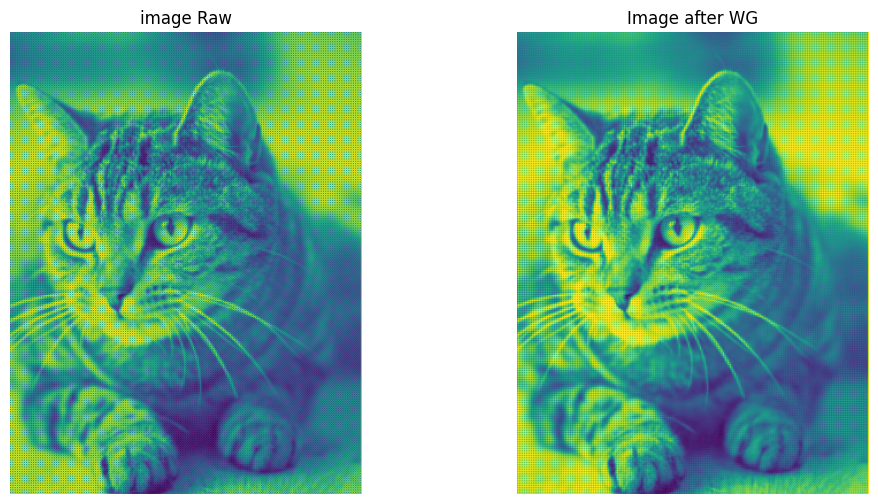

In [31]:
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1);plt.axis('off')
plt.imshow(img_Inverse_WB)
plt.title('image Raw')
plt.subplot(1, 2, 2);plt.axis('off')
plt.imshow(img_WB)
plt.title('Image after WG')

## 4.2 Demosaic

In [32]:
img_demosaic = demosaic(img_WB, pattern=pattern) #pattern='RGGB'

Text(0.5, 1.0, 'Image after demosaic')

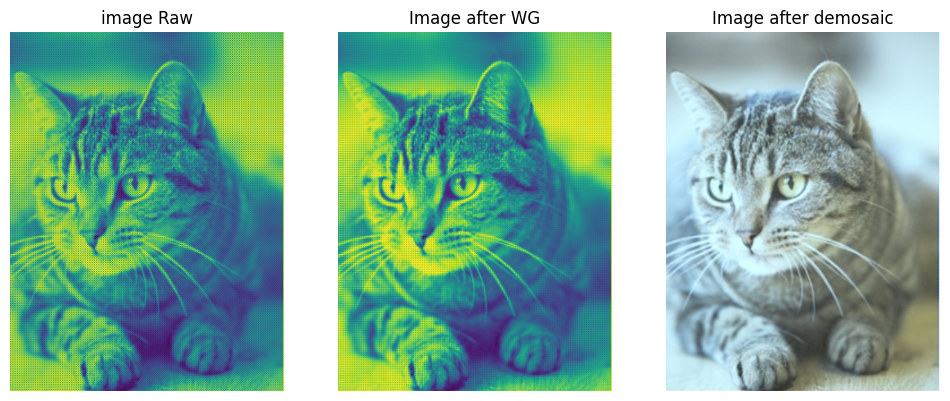

In [33]:
plt.figure(figsize=(12, 6))
plt.subplot(1, 3, 1);plt.axis('off')
plt.imshow(img_Inverse_WB)
plt.title('image Raw')
plt.subplot(1, 3, 2);plt.axis('off')
plt.imshow(img_WB)
plt.title('Image after WG')
plt.subplot(1, 3, 3);plt.axis('off')
plt.imshow(img_demosaic)
plt.title('Image after demosaic')

## 4.3 Color Correction

In [34]:
img_color_correction = color_correction(img_demosaic, ccm_inv)

Text(0.5, 1.0, 'Image after Color Correction')

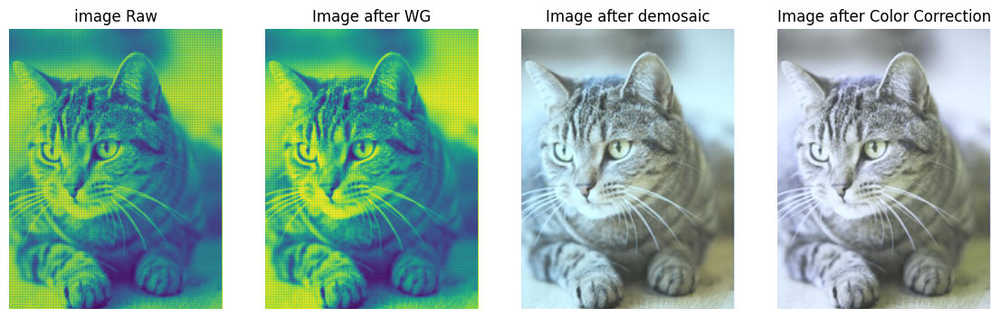

In [35]:
plt.figure(figsize=(14, 6))
plt.subplot(1, 4, 1);plt.axis('off')
plt.imshow(img_Inverse_WB)
plt.title('image Raw')
plt.subplot(1, 4, 2);plt.axis('off')
plt.imshow(img_WB)
plt.title('Image after WG')
plt.subplot(1, 4, 3);plt.axis('off')
plt.imshow(img_demosaic)
plt.title('Image after demosaic')
plt.subplot(1, 4, 4);plt.axis('off')
plt.imshow(img_color_correction)
plt.title('Image after Color Correction')

## 4.4 XYZ2RGB

In [36]:
img_RGB = cv2.cvtColor(img_color_correction.astype(np.float32), cv2.COLOR_XYZ2RGB)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.109851..1.13429].


Text(0.5, 1.0, 'Image after XYZ2RGB')

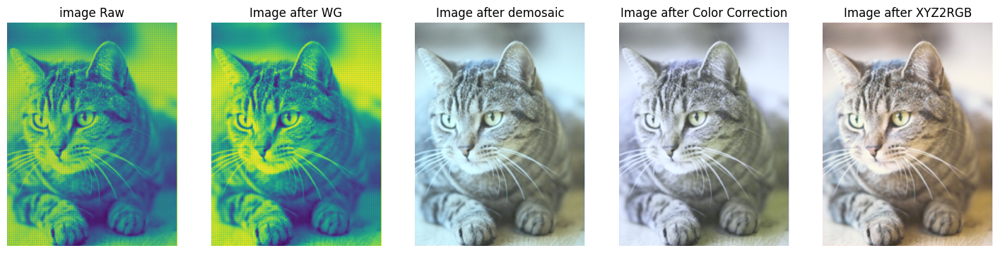

In [37]:
plt.figure(figsize=(18, 6))
plt.subplot(1, 5, 1);plt.axis('off')
plt.imshow(img_Inverse_WB)
plt.title('image Raw')
plt.subplot(1, 5, 2);plt.axis('off')
plt.imshow(img_WB)
plt.title('Image after WG')
plt.subplot(1, 5, 3);plt.axis('off')
plt.imshow(img_demosaic)
plt.title('Image after demosaic')
plt.subplot(1, 5, 4);plt.axis('off')
plt.imshow(img_color_correction)
plt.title('Image after Color Correction')
plt.subplot(1, 5, 5);plt.axis('off')
plt.imshow(img_RGB)
plt.title('Image after XYZ2RGB')

## 4.5 tone mapping

In [38]:
img_tm = tone_mapping(img_RGB, I, B, index=tone_index, inv=False)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.109851..1.13429].


Text(0.5, 1.0, 'Image after tone mapping')

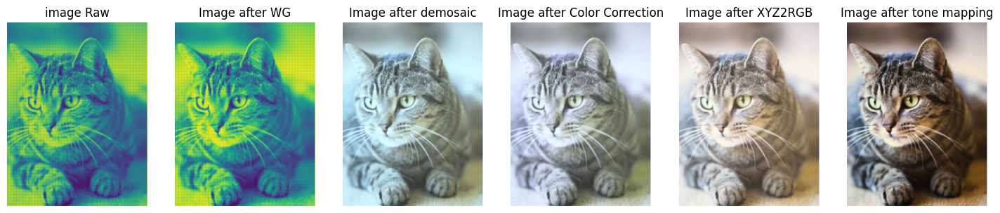

In [39]:
plt.figure(figsize=(18, 6))
plt.subplot(1, 6, 1);plt.axis('off')
plt.imshow(img_Inverse_WB)
plt.title('image Raw')
plt.subplot(1, 6, 2);plt.axis('off')
plt.imshow(img_WB)
plt.title('Image after WG')
plt.subplot(1, 6, 3);plt.axis('off')
plt.imshow(img_demosaic)
plt.title('Image after demosaic')
plt.subplot(1, 6, 4);plt.axis('off')
plt.imshow(img_color_correction)
plt.title('Image after Color Correction')
plt.subplot(1, 6, 5);plt.axis('off')
plt.imshow(img_RGB)
plt.title('Image after XYZ2RGB')
plt.subplot(1, 6, 6);plt.axis('off')
plt.imshow(img_tm)
plt.title('Image after tone mapping')

## Peak Signal-to-Noise Ratio

In [40]:
def calculate_psnr(img1, img2):
    '''
    Input:
        img1, img2: H*W*3 numpy array
    Output:
        psnr: the peak signal-to-noise ratio value
    '''
    ########################################################################
    # TODO:                                                                #
    #   Following above instruction to get PSNR as output.                 #
    #                                                                      #
    ########################################################################

    mse = np.mean((img1 - img2) ** 2)
    
    if mse == 0:
        return 100 # 當兩張圖片完全相同時，PSNR 是無窮大
    
    # 計算PSNR
    max_pixel = 1.0   # 影像已正規化到 [0, 1] 範圍內
    psnr = 20 * np.log10(max_pixel / np.sqrt(mse)) 

    return psnr

In [41]:
calculate_psnr(img, img_tm)

35.210191016871619

Text(0.5, 1.0, 'Image after inverse process')

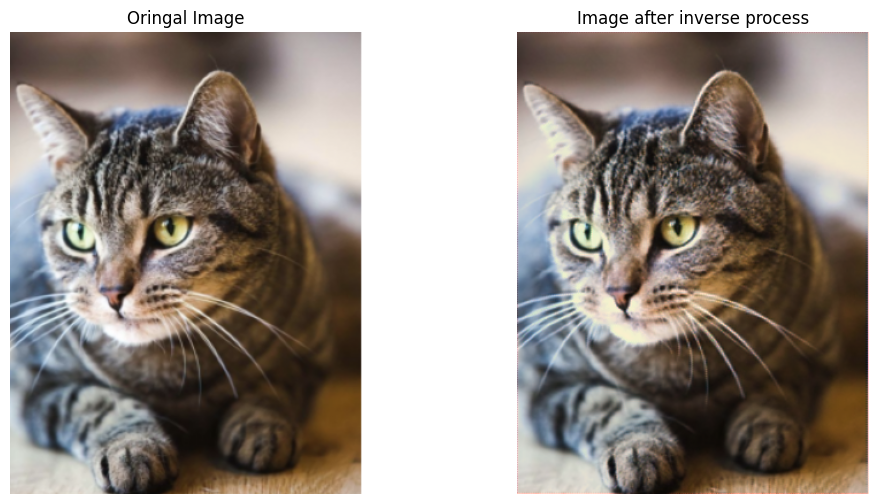

In [42]:
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1);plt.axis('off')
plt.imshow(img)
plt.title('Oringal Image')
plt.subplot(1, 2, 2);plt.axis('off')
plt.imshow(img_tm)
plt.title('Image after inverse process')